In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
import scipy.sparse as sp
import yaml
import time
from tqdm import tqdm
import gget
import scipy
from scipy.stats import zscore
from tqdm import tqdm
from statsmodels.stats.multitest import multipletests
from scipy.spatial.distance import cdist
from scipy.stats import spearmanr

import anndata as an
import scanpy as sc
import scanpy.external as sce
import rapids_singlecell as rsc
import scvi

import cupy as cp
from cuml.manifold import TSNE
from cuml.decomposition import PCA

sc.settings.verbosity = 3

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_categorical_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_continuous_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


In [3]:
%%time
fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/pseudotime.h5ad"
adata = sc.read_h5ad(fpath)

group_map = {
    'C1' : "reprogram",
    'C2' : "reprogram",
    'C3' : "reprogram",
    'C4' : "control",
    'C5' : "control",
}

adata.obs['group'] = adata.obs['cluster_str'].map(group_map)

adata

CPU times: user 337 ms, sys: 1.84 s, total: 2.18 s
Wall time: 4.25 s


AnnData object with n_obs × n_vars = 15867 × 21412
    obs: 'batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters', 'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'nnz', 'group'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions', '

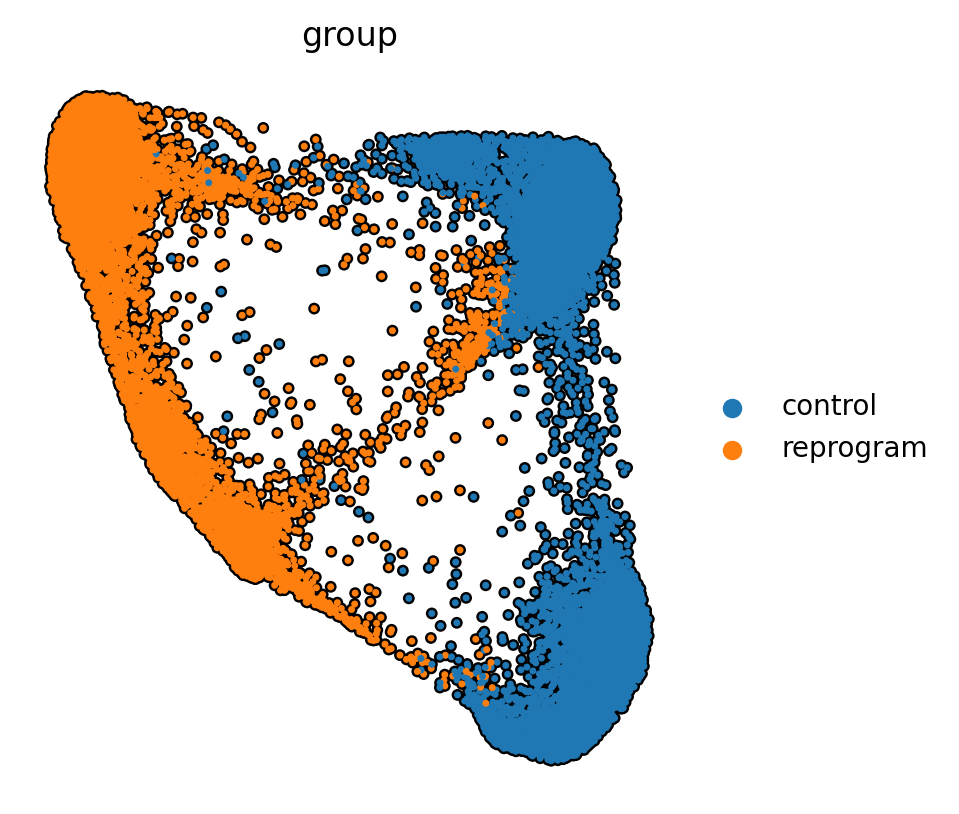

In [6]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4.25, 4.75

sc.pl.draw_graph(
    adata, 
    color='group',
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    outline_color=('k', 'k'),
    frameon=False,
)

In [9]:
# HSC-related transcription factors with roles in quiescence/activation
gene_list = [
    "CTNNB1",   # β-catenin: promotes activation in hematopoietic stem cells
    "CEBPA",    # C/EBPα: maintains quiescence in hematopoietic stem cells
    "CTCF",     # CTCF: promotes activation of long-term quiescent HSCs
    "MECOM",    # Evi-1: maintains quiescence in hematopoietic stem cells
    "FOXM1",    # FOXM1: enforces quiescence, allows long-term self-renewal in HSC
    "FOXO3",    # FOXO: enforces quiescence and protects against ROS in HSC
    "GFI1",     # GFI1: restricts proliferation and promotes self-renewal in HSC
    "HLF",      # HLF: maintains stem cell pool and protects from stress in HSC
    "ID1",      # ID1: promotes exit from quiescence in HSC
    "ELF4",     # MEF/ELF4: promotes exit from quiescence in HSC
    "MYC",      # Myc: promotes proliferation and quiescence viability in HSC
    "NFKB1",    # NF-KB: promotes activation in hematopoietic stem cells
    "NKX2-3",   # NKX2-3: maintains self-renewal of hematopoietic stem cells
    "NFE2L2",   # Nrf2: maintains quiescence of hematopoietic stem cells
    "RARA",     # RARA: prevents exit from quiescence in HSC
    "NR1H3",    # NR1H3: prevents exit from quiescence in HSC
    "NR4A2",    # NR4A2 (NURR1): maintains quiescence in HSC
    "PBX1",     # PBX1: maintains quiescence in hematopoietic stem cells
    "SPI1",     # PU.1/SPI1: represses cell cycle and protein synthesis in HSC
    "SATB1",    # SATB1: promotes self-renewal and quiescence in HSC
    "TAL1",     # SCL/TAL1: impedes G0→G1 transition in HSC
    "TCF15",    # TCF15: drives quiescence and long-term self-renewal in HSC
    "TP53",     # TP53: enforces quiescence in HSC
    "YY1",      # YY1: maintains quiescence and long-term self-renewal in HSC
    "ZFP521",   # ZFP521: maintains quiescence in hematopoietic stem cells
]

print(f"raw: {len(gene_list)}")
gene_list = [x for x in gene_list if x in adata.var_names]
print(f"filtered: {len(gene_list)}")

raw: 25
filtered: 17


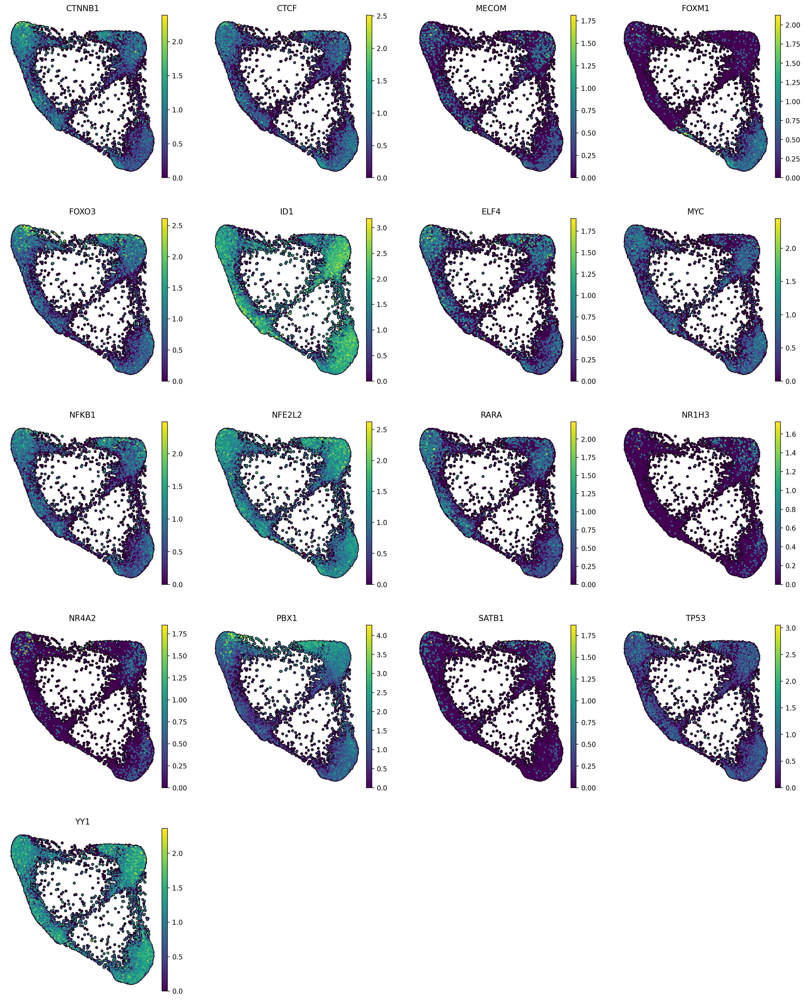

In [11]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4.25, 4.75

sc.pl.draw_graph(
    adata, 
    color=gene_list,
    size=25,
    ncols=4,
    alpha=1,
    use_raw=False,
    layer='log_norm',
    add_outline=True,
    na_in_legend=False,
    outline_color=('k', 'k'),
    frameon=False,
)

computing score 'quiescence'
    finished: added
    'quiescence', score of gene set (adata.obs).
    204 total control genes are used. (0:00:01)


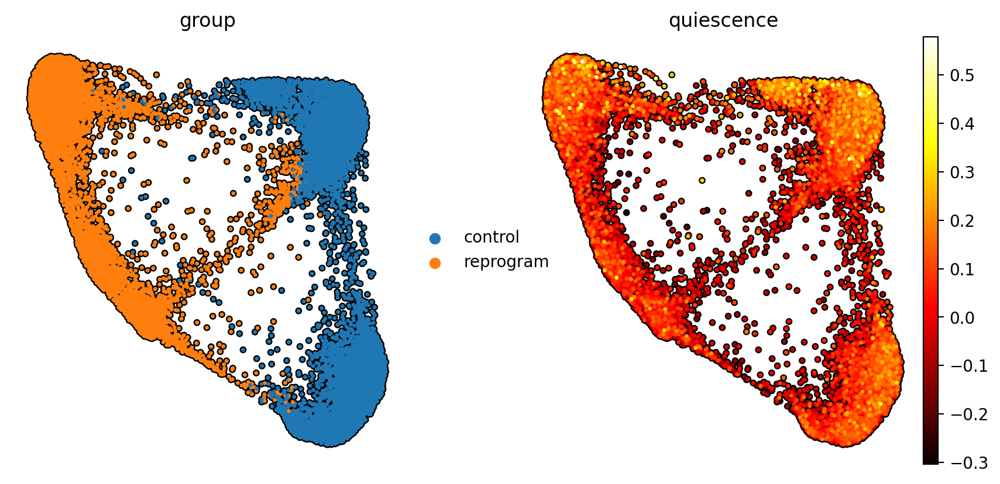

CPU times: user 1.48 s, sys: 504 ms, total: 1.98 s
Wall time: 1.99 s


In [15]:
%%time

# score genes
sc.tl.score_genes(
    adata,
    gene_list=gene_list,
    ctrl_size=len(gene_list),
    use_raw=False,
    score_name='quiescence',
    layer='log_norm',
)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4.25, 4.75

sc.pl.draw_graph(
    adata, 
    color=['group', 'quiescence'],
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    outline_color=('k', 'k'),
    cmap='hot',
    frameon=False,
)

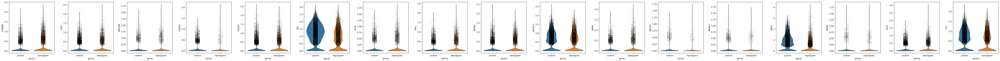

CPU times: user 14 s, sys: 97 ms, total: 14.1 s
Wall time: 2.99 s


In [19]:
%%time
sc.pl.violin(
    adata,
    gene_list,
    groupby="group",
    use_raw=False,
    layer='log_norm',
)

In [ ]:
sc.pl.heatmap(
    adata, 
    gene_list, 
    groupby="cluster_str",
    cmap="viridis",
    dendrogram=True,
    use_raw=False,
    layer='log_norm',
)